This script creates embeddings of the different data features and representations exported from .feature_extraction.ipynb

In [603]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json

import umap
from umap.umap_ import nearest_neighbors
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from matplotlib.patches import Patch

from mpl_toolkits.mplot3d import Axes3D

In [604]:
calls_df = pd.read_csv('features_and_spectrograms.csv')
calls_df['log_padded_spectrogram'] = calls_df['log_padded_spectrogram'].apply(lambda x: np.array(json.loads(x)))


In [605]:
calls_df["log_padded_spectrogram"].iloc[0]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [606]:
print(len(calls_df[calls_df.isna().any(axis=1)]))
calls_df = calls_df.dropna()

902


Only keep a random subset of recruitment, departure and contact calls to balance the data

In [607]:
subset_size = 500

subsample_sizes = {
    'recruitment': subset_size,
    'contact': subset_size,
    'departure': subset_size,
}

# Randomly subsample per call type
def subsample_group(group):
    call_type = group.name  # Group name corresponds to call type
    if call_type in subsample_sizes:
        return group.sample(n=subsample_sizes[call_type], random_state=42)
    return group  # Return untouched if no subsampling is needed

# Group by type and apply subsampling
calls_df = calls_df.groupby('call_type', group_keys=False).apply(subsample_group)

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_1574/4077462294.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  calls_df = calls_df.groupby('call_type', group_keys=False).apply(subsample_group)


/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_1574/1510808998.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  hist = sns.histplot(


[]

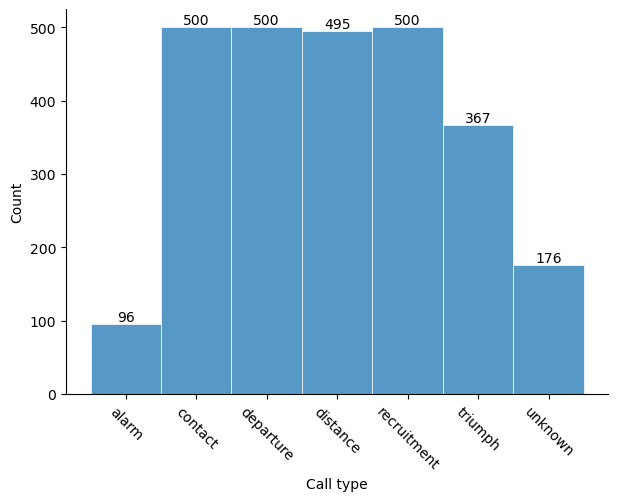

In [608]:
f, ax = plt.subplots(figsize=(7, 5))
sns.despine(f)

hist = sns.histplot(
    calls_df,
    x="call_type",
    multiple="stack",
    palette="viridis",
    edgecolor="1",
    linewidth=.5,
)

plt.xticks(rotation=-45)
ax.set_xlabel("Call type")

# Add counts
for p in hist.patches:
    height = p.get_height()
    x = p.get_x() + p.get_width() / 2
    ax.annotate(f'{int(height)}', (x, height), ha='center', va='bottom')
    
plt.plot()

In [609]:
from sklearn.preprocessing import LabelEncoder

In [610]:
le = LabelEncoder()
le.fit(calls_df["call_type"])
calls_df["encoded_call_type"] = le.transform(calls_df["call_type"])

In [611]:
calls_df.head()

,track_ID,clip_ID,goose_ID,call_type,waveform,sr,filepath,lfccs,duration,normalized_log_length,log_target_duration,log_padded_spectrogram,log_padded_lfccs,f0mean,f0range,f0min,f0max,f0std_dev,mean_slope,f0_q1,f0_q2,f0_q3,hnr,centr_s,skew_s,kurt_s,std_s,centr_t,skew_t,kurt_t,std_t,avg_f_form1,avg_f_form2,avg_f_form3,encoded_call_type
220,GT00052,G00282,Dagobert,alarm,[-0.00088666 -0.00088666 -0.00051722 ... 0. ...,44100,/Users/lenagies/Desktop/Master/Thesis/geese/da...,[[-8.5444928e+02 -7.7520984e+02 -7.0113843e+02...,0.204444,0.503463,0.576409,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[[0. 0. 0. 0. ...,877.138325,825.896144,925.840528,99.944384,22.669908,3477.968862,860.345698,877.126020,894.283432,5.061631,2869.237457,2.048153,5.521327,1862.916438,0.231474,-2.700455,6.538478,92.549320,1616.990397,2197.148523,3478.998642,0
278,GT00058,G00331,Besenstiel,alarm,[0.00162022 0.00129618 0.00032404 ... 0.000324...,44100,/Users/lenagies/Desktop/Master/Thesis/geese/da...,[[-8.4928613e+02 -8.4047424e+02 -8.3039911e+02...,0.168889,0.447346,0.516267,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[[0. 0. 0. 0. ...,1024.114457,679.049235,1205.398864,526.349628,163.861712,13272.653401,891.900452,1083.187893,1124.979818,8.185684,1761.165946,1.091501,2.561363,816.904709,0.156644,-0.330461,-1.219547,26.480288,1059.670466,2020.352716,2738.944888,0
324,GT00989,G14230,unknown,alarm,[-0.00021263 0. 0. ... -0.00...,44100,/Users/lenagies/Desktop/Master/Thesis/geese/da...,[[-840.65717 -824.5812 -808.21423 ... -...,0.130794,0.372266,0.435800,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[[0. 0. 0. 0. ...,937.407027,730.068757,1121.201924,391.133167,116.502540,16239.312607,855.616467,929.156059,1043.560424,3.214329,1402.882267,3.237808,16.072720,760.640306,0.142857,-2.012193,2.577479,111.900514,996.180536,1864.939889,2743.216577,0
358,GT00055,G00310,Lausbursch,alarm,[-0.00919188 -0.00995787 -0.01034087 ... -0.00...,44100,/Users/lenagies/Desktop/Master/Thesis/geese/da...,[[-8.1304553e+02 -8.1948218e+02 -8.3650635e+02...,0.341587,0.654229,0.737993,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[[0. 0. 0. ... 0. 0. 0.]\n [0. 0. 0. ... 0. 0....,1163.502602,937.714364,1281.607130,343.892766,77.205086,23983.048842,1096.354655,1174.012665,1232.246675,5.831131,1265.752760,3.018001,12.943833,482.630433,0.233220,0.721941,-0.947202,16.135153,1122.136070,1654.332442,2548.684413,0
715,GT00989,G14235,unknown,alarm,[-0.00161031 0. 0. ... 0.00...,44100,/Users/lenagies/Desktop/Master/Thesis/geese/da...,[[-7.8099615e+02 -7.5526978e+02 -7.4180713e+02...,0.173968,0.456050,0.525595,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[[0. 0. 0. 0. ...,1318.373756,1231.775633,1434.196828,202.421196,42.312494,6882.774653,1292.476030,1307.020302,1347.439894,9.576855,1353.583098,10.416580,195.954688,396.684880,0.136644,-3.341352,10.546476,77.254176,1250.963230,1528.429774,2686.957678,0


# Cluster and validate the different represenations

## NN Graphs and UMAP embeddings

In [612]:
N_NEIGHBORS = 15
DISTANCE_METRIC = "minkowski" #with default p=2 corresponds to euclidian distance
RANDOM_SEED = 42

#### Analyze predefined audio features

In [613]:
features_scaled = StandardScaler().fit_transform(calls_df.drop(columns=["call_type", "track_ID", "clip_ID", "goose_ID", "waveform", "sr", "filepath", "normalized_log_length", "log_target_duration", "log_padded_spectrogram", "lfccs", "log_padded_lfccs"]))
# considering scaling: https://github.com/lmcinnes/umap/issues/66

In [614]:
nn_results_paf = nearest_neighbors(
    features_scaled,
    n_neighbors=N_NEIGHBORS,
    metric=DISTANCE_METRIC,
    metric_kwds={},
    angular=False,
    random_state=RANDOM_SEED,
    verbose=True,
)

Thu Dec 19 13:52:34 2024 Finding Nearest Neighbors
Thu Dec 19 13:52:34 2024 Building RP forest with 8 trees
Thu Dec 19 13:52:34 2024 NN descent for 11 iterations
	 1  /  11
	 2  /  11
	 3  /  11
	Stopping threshold met -- exiting after 3 iterations
Thu Dec 19 13:52:34 2024 Finished Nearest Neighbor Search


In [615]:
def display_nearest_neighbours(nn_graph, df, n_examples=5, n_neighbors=15):
    fig, axs = plt.subplots(nrows=n_examples, ncols=n_neighbors, figsize=(n_neighbors, n_examples))

    for i in range(n_examples):
        for j in range(n_neighbors):
            axs[i, j].matshow(df.iloc[nn_graph[0][i][j]]["log_padded_spectrogram"], origin="lower", cmap="magma", aspect="auto")
            axs[i, j].axis("off")
    plt.tight_layout()
    plt.show()

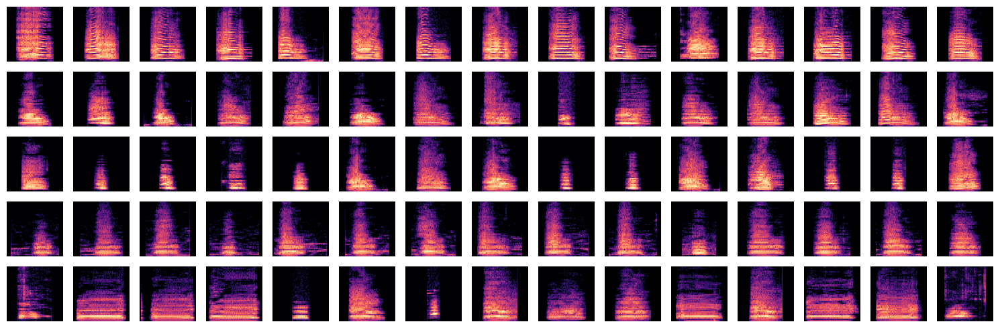

In [616]:
display_nearest_neighbours(nn_results_paf, calls_df)

In [617]:
embeddings_paf = umap.UMAP(precomputed_knn=nn_results_paf, n_neighbors=15, n_components=2, min_dist=0.1).fit_transform(features_scaled)

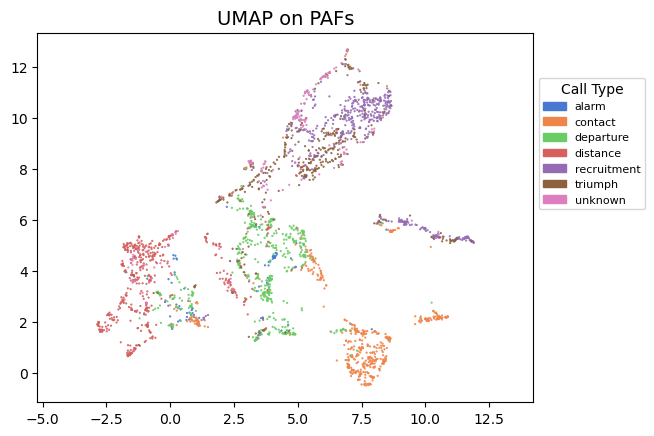

In [618]:
unique_call_types = calls_df["call_type"].unique()
color_palette = sns.color_palette("muted", len(unique_call_types))
call_type_to_color = {call_type: color for call_type, color in zip(unique_call_types, color_palette)}

# Assign colors to points
colors = [call_type_to_color[call_type] for call_type in calls_df["call_type"]]

# Scatter plot
plt.scatter(
    embeddings_paf[:, 0],
    embeddings_paf[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP on PAFs', fontsize=14)

# Legend
legend_patches = [Patch(color=color, label=call_type) for call_type, color in call_type_to_color.items()]
plt.legend(
    handles=legend_patches,
    title="Call Type",
    fontsize=8,
    title_fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.0, 0.7)
)

plt.show()

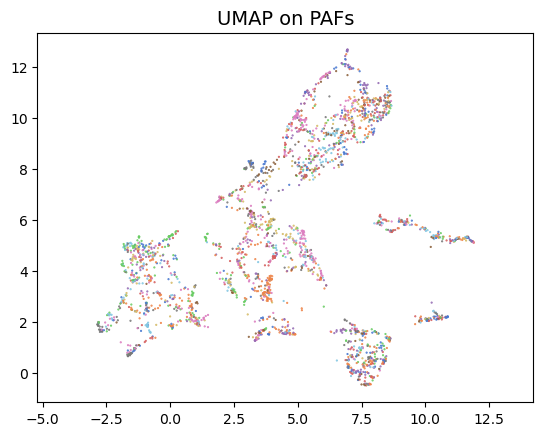

In [619]:
unique_goose_ids = calls_df["goose_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_goose_ids))
goose_id_to_color = {goose_id: color for goose_id, color in zip(unique_goose_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[goose_id] for goose_id in calls_df["goose_ID"]]

# Scatter plot
plt.scatter(
    embeddings_paf[:, 0],
    embeddings_paf[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP on PAFs', fontsize=14)

# Legend
# legend_patches = [Patch(color=color, label=goose_id) for goose_id, color in goose_id_to_color.items()]
# plt.legend(
#     handles=legend_patches,
#     title="Goose ID",
#     fontsize=8,
#     title_fontsize=10,
#     loc="center left",
#     bbox_to_anchor=(1.0, 0.7)
# )

plt.show()

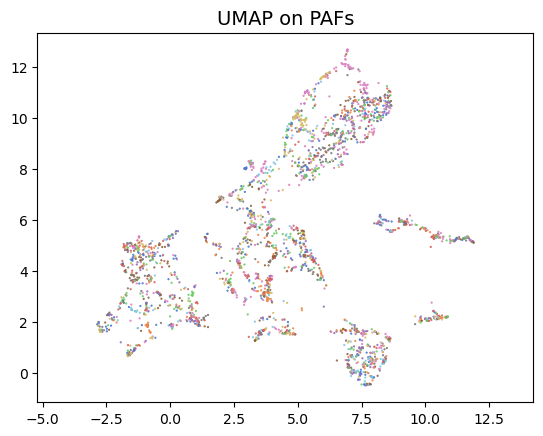

In [620]:
unique_track_ids = calls_df["track_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_track_ids))
goose_id_to_color = {track_id: color for track_id, color in zip(unique_track_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[track_id] for track_id in calls_df["track_ID"]]

# Scatter plot
plt.scatter(
    embeddings_paf[:, 0],
    embeddings_paf[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP on PAFs', fontsize=14)

plt.show()

#### Analyze spectrograms

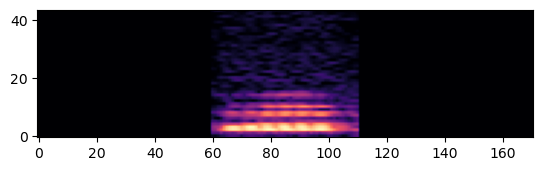

(44, 171)


In [621]:
# longest call
#vocalization = calls_df.loc[calls_df["duration"].idxmax()]
# random call
vocalization = calls_df.iloc()[np.random.randint(0, len(calls_df))]

plt.imshow(vocalization["log_padded_spectrogram"], origin="lower", cmap="magma")
plt.show()
print(vocalization["log_padded_spectrogram"].shape)

In [622]:
labels_and_spectrograms = []
for idx, row in calls_df.iterrows():
    labels_and_spectrograms.append([row["call_type"], row["track_ID"], row["goose_ID"], *row["log_padded_spectrogram"].flatten()])

In [623]:
column_names = ["call_type", "track_ID", "goose_ID"]
for i in range(len(calls_df.iloc[0]["log_padded_spectrogram"].flatten())):
    column_names.append(i)

In [624]:
labels_and_spectrograms_df = pd.DataFrame(labels_and_spectrograms, columns=column_names, index=None) 
labels_and_spectrograms_df.head()

,call_type,track_ID,goose_ID,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,...,7484,7485,7486,7487,7488,7489,7490,7491,7492,7493,7494,7495,7496,7497,7498,7499,7500,7501,7502,7503,7504,7505,7506,7507,7508,7509,7510,7511,7512,7513,7514,7515,7516,7517,7518,7519,7520,7521,7522,7523
0,alarm,GT00052,Dagobert,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.031806,0.026655,0.032315,0.062791,0.097211,0.117164,0.128905,0.130051,0.130155,...,0.029321,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,alarm,GT00058,Besenstiel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.146648,0.109225,0.071212,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,alarm,GT00989,unknown,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,alarm,GT00055,Lausbursch,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.331909,0.271497,0.260248,0.25344,0.220723,0.125607,0.110399,0.125408,0.111518,0.08457,0.092755,0.054715,0.020791,0.004857,0.0,0.005942,0.004757,0.000000,0.046737,0.060206,0.036998,0.063118,0.093059,0.102488,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,alarm,GT00989,unknown,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.093774,0.072593,0.057537,0.037678,...,0.000000,0.0,0.0,0.0,0.003648,0.004078,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##### UMAP

In [625]:
labels_and_spectrograms_scaled = StandardScaler().fit_transform(labels_and_spectrograms_df.drop(columns=["call_type", "track_ID", "goose_ID"]))

In [626]:
nn_results_spec = nearest_neighbors(
    labels_and_spectrograms_scaled,
    n_neighbors=N_NEIGHBORS,
    metric=DISTANCE_METRIC,
    metric_kwds={},
    angular=False,
    random_state=RANDOM_SEED,
    verbose=True,
)

Thu Dec 19 13:52:49 2024 Finding Nearest Neighbors
Thu Dec 19 13:52:49 2024 Building RP forest with 8 trees
Thu Dec 19 13:52:49 2024 NN descent for 11 iterations
	 1  /  11
	 2  /  11
	 3  /  11
	 4  /  11
	Stopping threshold met -- exiting after 4 iterations
Thu Dec 19 13:52:50 2024 Finished Nearest Neighbor Search


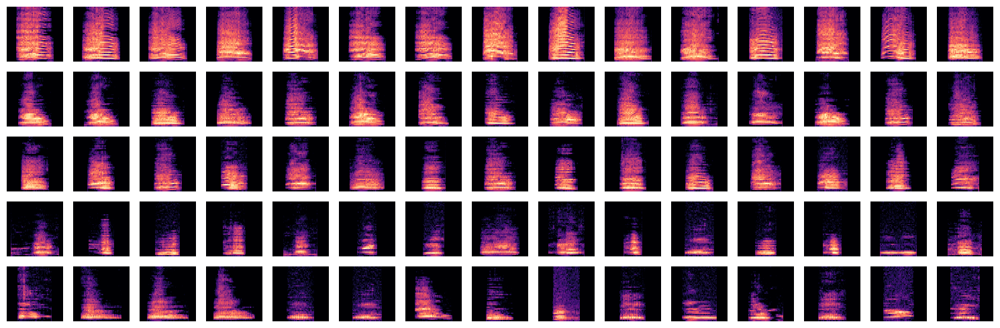

In [627]:
display_nearest_neighbours(nn_results_spec, calls_df)

In [628]:
embeddings_spec = umap.UMAP(precomputed_knn=nn_results_spec, n_neighbors=N_NEIGHBORS, n_components=2, min_dist=0.1).fit_transform(labels_and_spectrograms_scaled)

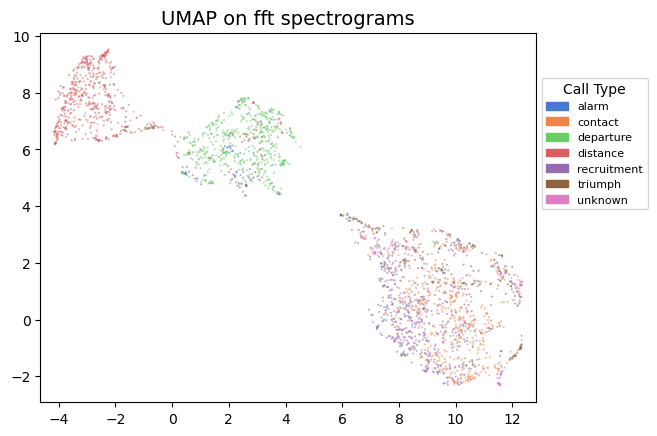

In [ ]:
unique_call_types = labels_and_spectrograms_df["call_type"].unique()
color_palette = sns.color_palette("muted", len(unique_call_types))
call_type_to_color = {call_type: color for call_type, color in zip(unique_call_types, color_palette)}

# Assign colors to points
colors = [call_type_to_color[call_type] for call_type in labels_and_spectrograms_df["call_type"]]

# Scatter plot
plt.scatter(
    embeddings_spec[:, 0],
    embeddings_spec[:, 1],
    c=colors,
    alpha=0.5,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP on fft spectrograms', fontsize=14)

# Legend
legend_patches = [Patch(color=color, label=call_type) for call_type, color in call_type_to_color.items()]
plt.legend(
    handles=legend_patches,
    title="Call Type",
    fontsize=8,
    title_fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.0, 0.7)
)

plt.show()

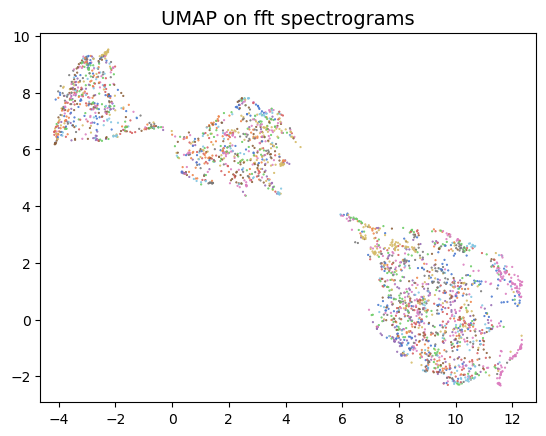

In [630]:
unique_track_ids = labels_and_spectrograms_df["track_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_track_ids))
track_id_to_color = {track_id: color for track_id, color in zip(unique_track_ids, color_palette)}

# Assign colors to points
colors = [track_id_to_color[track_id] for track_id in labels_and_spectrograms_df["track_ID"]]

# Scatter plot
plt.scatter(
    embeddings_spec[:, 0],
    embeddings_spec[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP on fft spectrograms', fontsize=14)

# legend_patches = [Patch(color=color, label=track_id) for track_id, color in track_id_to_color.items()]
# plt.legend(
#     handles=legend_patches,
#     title="Track_ID",
#     fontsize=8,
#     title_fontsize=10,
#     loc="center left",
#     bbox_to_anchor=(1.0, 0.7)
# )

plt.show()

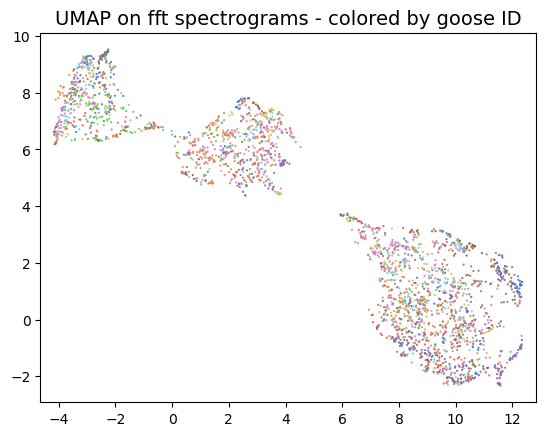

In [631]:
unique_goose_ids = labels_and_spectrograms_df["goose_ID"].unique()
color_palette = sns.color_palette("muted", len(unique_goose_ids))
goose_id_to_color = {goose_id: color for goose_id, color in zip(unique_goose_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[goose_id] for goose_id in labels_and_spectrograms_df["goose_ID"]]

# Scatter plot
plt.scatter(
    embeddings_spec[:, 0],
    embeddings_spec[:, 1],
    c=colors,
    s=0.3
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP on fft spectrograms - colored by goose ID', fontsize=14)

# Legend
# legend_patches = [Patch(color=color, label=goose_id) for goose_id, color in goose_id_to_color.items()]
# plt.legend(
#     handles=legend_patches,
#     title="Goose ID",
#     fontsize=8,
#     title_fontsize=10,
#     loc="center left",
#     bbox_to_anchor=(1.0, 0.7)
# )

plt.show()

In [632]:
embeddings3d = umap.UMAP(precomputed_knn=nn_results_spec, n_neighbors=N_NEIGHBORS, n_components=3, min_dist=0.1).fit_transform(labels_and_spectrograms_scaled)

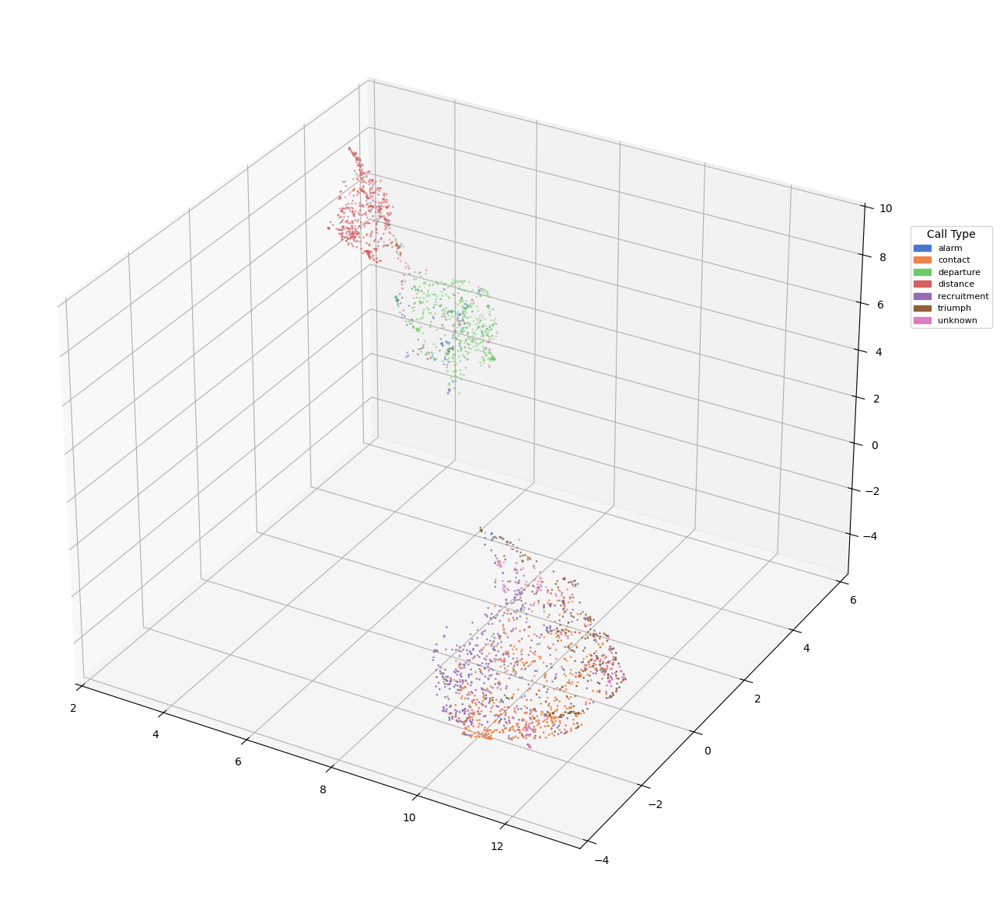

In [633]:
unique_goose_ids = labels_and_spectrograms_df["call_type"].unique()
color_palette = sns.color_palette("muted", len(unique_goose_ids))
goose_id_to_color = {call_type: color for call_type, color in zip(unique_goose_ids, color_palette)}

# Assign colors to points
colors = [goose_id_to_color[call_type] for call_type in labels_and_spectrograms_df["call_type"]]

# for 3D
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot in 3D
ax.scatter( 
    embeddings3d[:, 0],
    embeddings3d[:, 1],
    embeddings3d[:, 2],
    c=colors,
    s=1)

legend_patches = [Patch(color=color, label=call_type) for call_type, color in goose_id_to_color.items()]
plt.legend(
    handles=legend_patches,
    title="Call Type",
    fontsize=8,
    title_fontsize=10,
    loc="center left",
    bbox_to_anchor=(1.0, 0.7)
)

## Visualize acoustic features

In [780]:
def _normalize(feature_values):
    return (feature_values - feature_values.min()) / (feature_values.max() - feature_values.min())

def plot_colorcoded_feature(feature_column_name, embeddings, title_colorbar, title):
    colormap = plt.cm.viridis  # You can replace 'viridis' with another colormap like 'plasma', 'inferno', etc.
    colors = colormap(_normalize(calls_df[feature_column_name]))

    fig, ax = plt.subplots()

    scatter = ax.scatter(
        embeddings[:, 0],
        embeddings[:, 1],
        c=colors,
        s=1,
    )
    plt.gca().set_aspect('equal', 'datalim')
    plt.title(title, fontsize=14)

    # Add a colorbar
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=calls_df[feature_column_name].min(), vmax=calls_df[feature_column_name].max())), ax=ax)
    cbar.set_label(title_colorbar)

    plt.show()


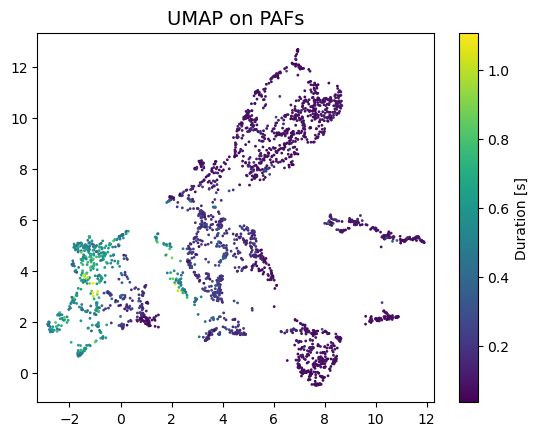

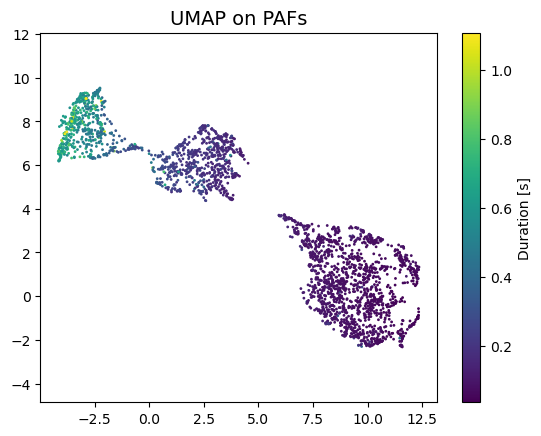

In [782]:
plot_colorcoded_feature("duration", embeddings_paf, "Duration [s]", "PAF embeddings")
plot_colorcoded_feature("duration", embeddings_spec, "Duration [s]", "Spectrogram embeddings")

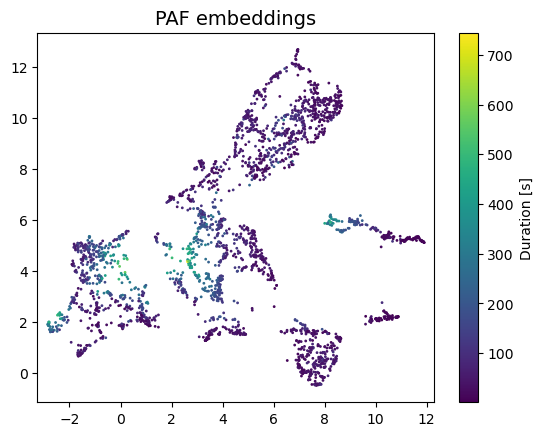

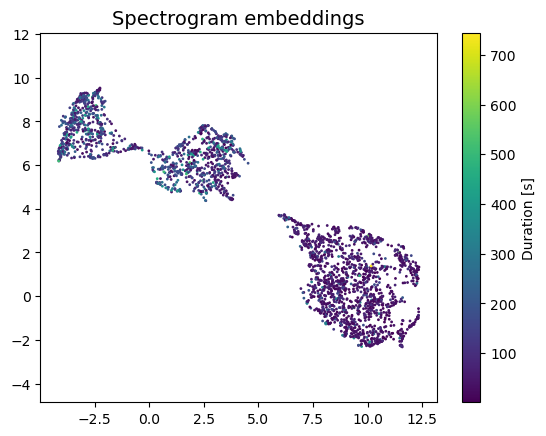

In [785]:
plot_colorcoded_feature("f0std_dev", embeddings_paf, "Duration [s]", "PAF embeddings")
plot_colorcoded_feature("f0std_dev", embeddings_spec, "Duration [s]", "Spectrogram embeddings")

## Clustering

#### k-means

In [634]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

In [712]:
# choosing n_clusters with silhouette analysis

# adapted from https://scikit-learn.org/1.5/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

def silhouette_analysis_kmeans(data, embeddings=None, plot=False):
    if embeddings is None:
        embeddings = data

    range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

    max_score, n = -1, 0
    
    for n_clusters in range_n_clusters:
        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=RANDOM_SEED)
        cluster_labels = clusterer.fit_predict(data)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )


        if silhouette_avg > max_score:
            max_score, n, labels = silhouette_avg, n_clusters, cluster_labels
        
        if plot:
            # Create a subplot with 1 row and 2 columns
            fig, (ax1, ax2) = plt.subplots(1, 2)
            fig.set_size_inches(18, 7)

            # The 1st subplot is the silhouette plot
            # The silhouette coefficient can range from -1 to 1
            ax1.set_xlim([-0.1, 1])

            # The (n_clusters+1)*10 is for inserting blank space between silhouette
            # plots of individual clusters, to demarcate them clearly.
            ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])

            # Compute the silhouette scores for each sample
            sample_silhouette_values = silhouette_samples(data, cluster_labels)

            y_lower = 10
            for i in range(n_clusters):
                # Aggregate the silhouette scores for samples belonging to
                # cluster i, and sort them
                ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

                ith_cluster_silhouette_values.sort()

                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i

                color = cm.nipy_spectral(float(i) / n_clusters)
                ax1.fill_betweenx(
                    np.arange(y_lower, y_upper),
                    0,
                    ith_cluster_silhouette_values,
                    facecolor=color,
                    edgecolor=color,
                    alpha=0.7,
                )

                # Label the silhouette plots with their cluster numbers at the middle
                ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

                # Compute the new y_lower for next plot
                y_lower = y_upper + 10  # 10 for the 0 samples

            ax1.set_title("Silhouette plot for the various clusters.")
            ax1.set_xlabel("Silhouette coefficient values")
            ax1.set_ylabel("Cluster label")

            # The vertical line for average silhouette score of all the values
            ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

            ax1.set_yticks([])  # Clear the yaxis labels / ticks
            ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

            # 2nd Plot showing the actual clusters formed
            colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
            ax2.scatter(
                embeddings[:, 0], embeddings[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
            )

            # Labeling the clusters
            centers = clusterer.cluster_centers_
            # Draw white circles at cluster centers
            ax2.scatter(
                centers[:, 0],
                centers[:, 1],
                marker="o",
                c="white",
                alpha=1,
                s=200,
                edgecolor="k",
            )

            for i, c in enumerate(centers):
                ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

            ax2.set_title("Visualization of the clustered data.")
            ax2.set_xlabel("Feature space for the 1st feature")
            ax2.set_ylabel("Feature space for the 2nd feature")

            plt.suptitle(
                "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
                % n_clusters,
                fontsize=14,
                fontweight="bold",
            )

        plt.show()
    return max_score, n, labels

In [717]:
print("-------------PAF--------------")
max_sil_score_kmeans_paf, n_clusters_kmeans_paf, labels_kmeans_paf = silhouette_analysis_kmeans(features_scaled, embeddings_paf)
print(f"best score with {n_clusters_kmeans_paf} clusters: {max_sil_score_kmeans_paf}")
print("\n--------PAF embeddings--------")
max_sil_score_kmeans_paf_emb, n_clusters_kmeans_paf_emb, labels_kmeans_paf_emb = silhouette_analysis_kmeans(embeddings_paf)
print(f"best score with {n_clusters_kmeans_paf_emb} clusters: {max_sil_score_kmeans_paf_emb}")
print("\n----Spectrogram embeddings----")
max_sil_score_kmeans_spec, n_clusters_kmeans_spec, labels_kmeans_spec = silhouette_analysis_kmeans(embeddings_spec)
print(f"best score with {n_clusters_kmeans_spec} clusters: {max_sil_score_kmeans_spec}")

-------------PAF--------------
For n_clusters = 2 The average silhouette_score is : 0.2158985951815692
For n_clusters = 3 The average silhouette_score is : 0.17901716336324797
For n_clusters = 4 The average silhouette_score is : 0.13480000767533426
For n_clusters = 5 The average silhouette_score is : 0.12875012410301198
For n_clusters = 6 The average silhouette_score is : 0.1390197612263801
For n_clusters = 7 The average silhouette_score is : 0.144801366330407
For n_clusters = 8 The average silhouette_score is : 0.15010165752951796
For n_clusters = 9 The average silhouette_score is : 0.14862898184958206
best score with 2 clusters: 0.2158985951815692

--------PAF embeddings--------
For n_clusters = 2 The average silhouette_score is : 0.39678922
For n_clusters = 3 The average silhouette_score is : 0.50405174
For n_clusters = 4 The average silhouette_score is : 0.52233416
For n_clusters = 5 The average silhouette_score is : 0.5421035
For n_clusters = 6 The average silhouette_score is : 0.

#### HDBSCAN

In [637]:
import hdbscan

##### cluster PAFs

In [747]:
hdbscan_clusters_paf = hdbscan.HDBSCAN(min_cluster_size=50, min_samples=10, cluster_selection_epsilon=1, prediction_data=True)
hdbscan_clusters_paf.fit(features_scaled)
print(hdbscan_clusters_paf.labels_.max()+1)

2


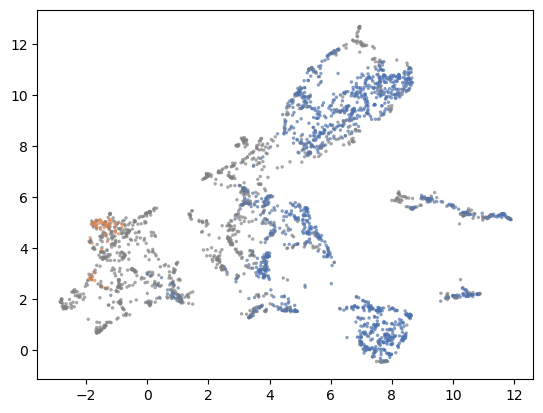

In [748]:
color_palette = sns.color_palette('deep', 8)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in hdbscan_clusters_paf.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, hdbscan_clusters_paf.probabilities_)]
plt.scatter(*embeddings_paf.T, linewidth=0, c=cluster_member_colors, alpha=0.7, s=6)

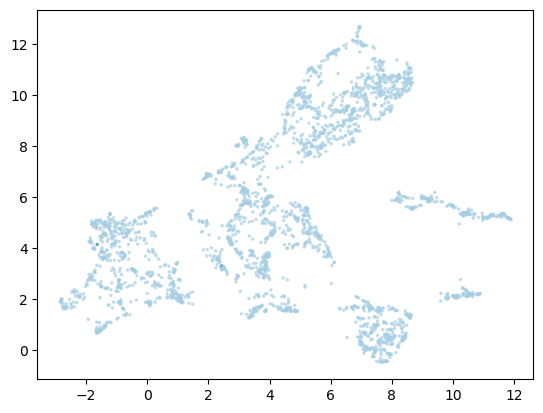

In [729]:
soft_clusters = hdbscan.all_points_membership_vectors(hdbscan_clusters_paf)
color_palette = sns.color_palette('Paired', 12)
cluster_colors = [color_palette[np.argmax(x)]
                  for x in soft_clusters]
plt.scatter(*embeddings_paf.T, linewidth=0, c=cluster_colors, alpha=0.7, s=6)

<Axes: ylabel='$\\lambda$ value'>

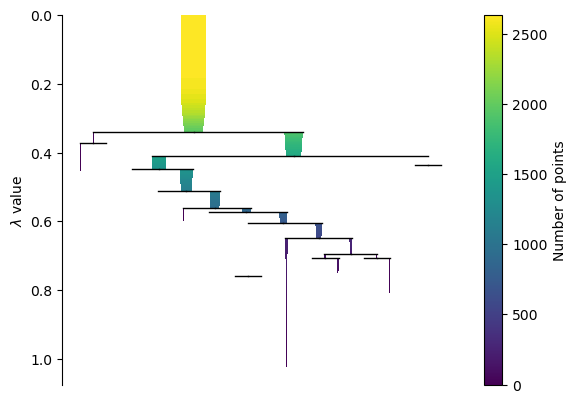

In [642]:
hdbscan_clusters_paf.condensed_tree_.plot()

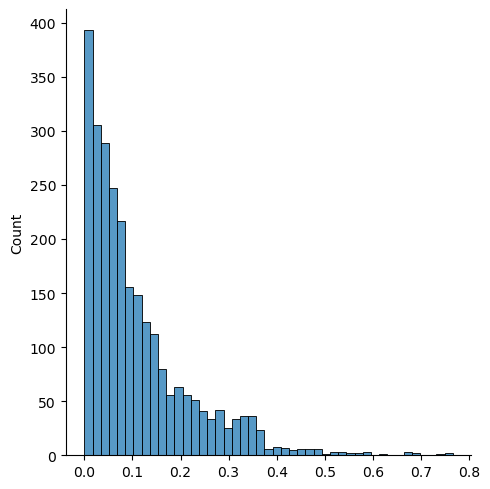

In [643]:
sns.displot(hdbscan_clusters_paf.outlier_scores_[np.isfinite(hdbscan_clusters_paf.outlier_scores_)], rug=False)

##### Cluster the embeddings

In [761]:
hdbscan_clusters_paf_emb = hdbscan.HDBSCAN(min_cluster_size=50, min_samples=50, cluster_selection_epsilon=1, prediction_data=True)
hdbscan_clusters_paf_emb.fit(embeddings_paf)
hdbscan_clusters_paf_emb.labels_.max()+1

np.int64(5)

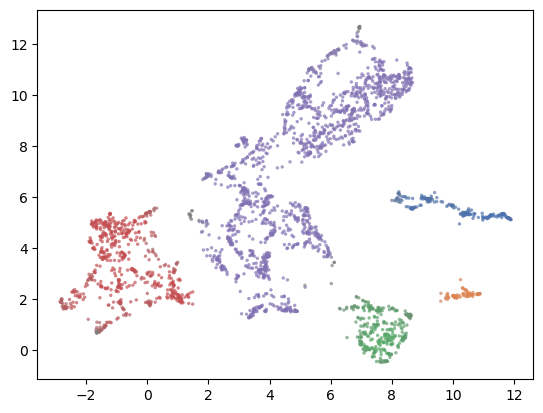

In [762]:
color_palette = sns.color_palette('deep', 8)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in hdbscan_clusters_paf_emb.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, hdbscan_clusters_paf_emb.probabilities_)]
plt.scatter(*embeddings_paf.T, linewidth=0, c=cluster_member_colors, alpha=0.7, s=6)

<Axes: ylabel='$\\lambda$ value'>

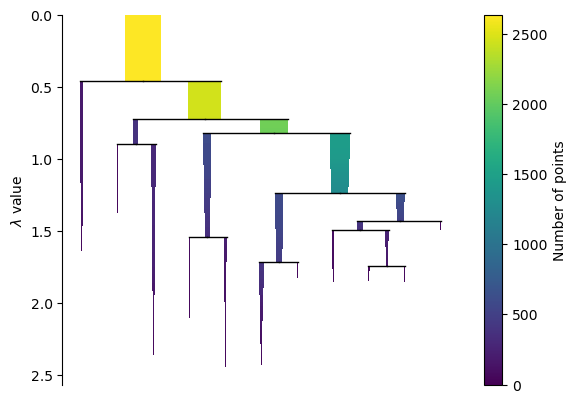

In [763]:
hdbscan_clusters_paf_emb.condensed_tree_.plot()

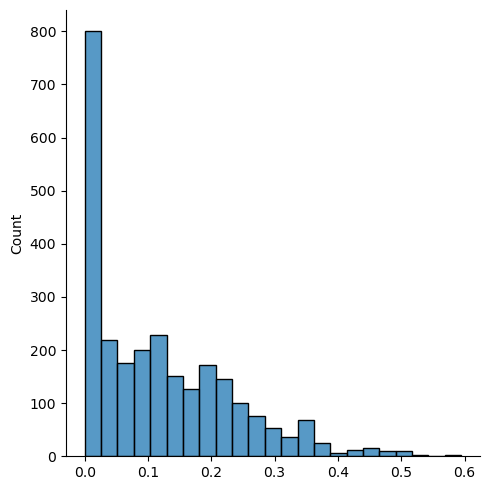

In [764]:
sns.displot(hdbscan_clusters_paf_emb.outlier_scores_[np.isfinite(hdbscan_clusters_paf_emb.outlier_scores_)], rug=False)

##### Cluster spectrogram embeddings

In [765]:
hdbscan_clusters_spec = hdbscan.HDBSCAN(min_cluster_size=25, min_samples=100, cluster_selection_epsilon=.7, prediction_data=True)
hdbscan_clusters_spec.fit(embeddings_spec)
hdbscan_clusters_spec.labels_.max()+1

np.int64(3)

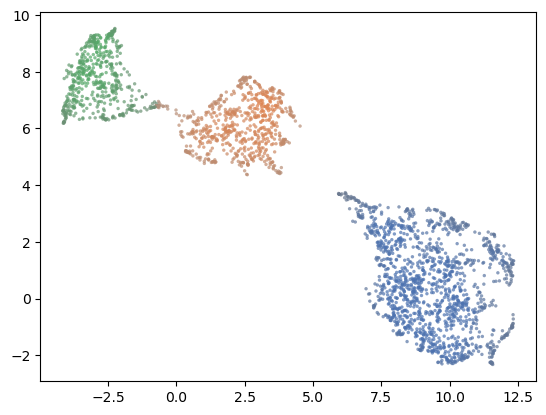

In [767]:
color_palette = sns.color_palette('deep', 8)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in hdbscan_clusters_spec.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, hdbscan_clusters_spec.probabilities_)]
plt.scatter(*embeddings_spec.T, linewidth=0, c=cluster_member_colors, alpha=0.7, s=6)

<Axes: ylabel='$\\lambda$ value'>

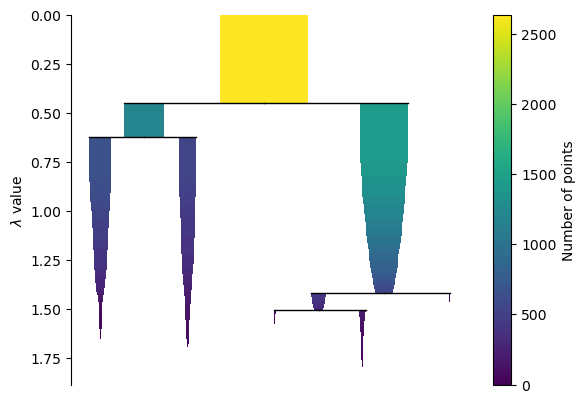

In [768]:
hdbscan_clusters_spec.condensed_tree_.plot()

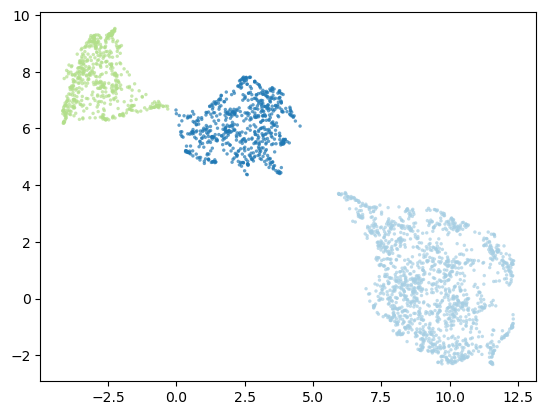

In [769]:
soft_clusters = hdbscan.all_points_membership_vectors(hdbscan_clusters_spec)
color_palette = sns.color_palette('Paired', 12)
cluster_colors = [color_palette[np.argmax(x)]
                  for x in soft_clusters]
plt.scatter(*embeddings_spec.T, linewidth=0, c=cluster_colors, alpha=0.7, s=6)

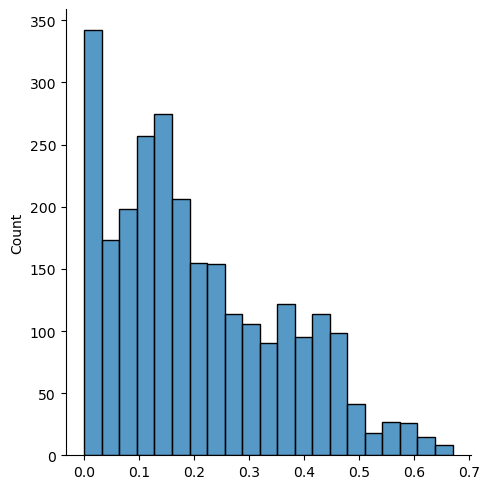

In [770]:
sns.displot(hdbscan_clusters_spec.outlier_scores_[np.isfinite(hdbscan_clusters_spec.outlier_scores_)], rug=False)

Text(0.5, 1.0, 'Noise points of HDBSCAN clustering on spectrogram embeddings')

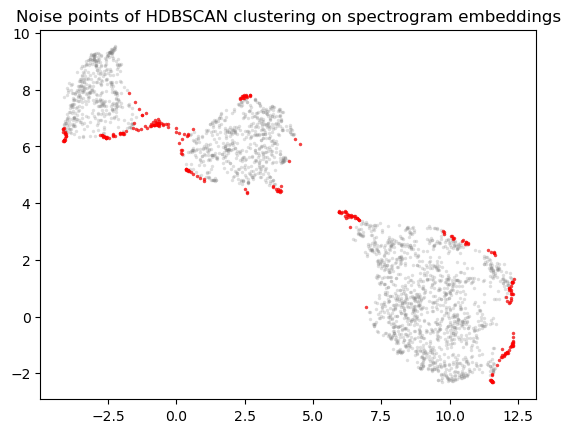

In [771]:
threshold = pd.Series(hdbscan_clusters_spec.outlier_scores_).quantile(0.9)
outliers = np.where(hdbscan_clusters_spec.outlier_scores_ > threshold)[0]
plt.scatter(*embeddings_spec.T, s=6, linewidth=0, c='gray', alpha=0.25)
plt.scatter(*embeddings_spec[outliers].T, linewidth=0, c='red', alpha=0.7, s=6)
plt.title("Noise points of HDBSCAN clustering on spectrogram embeddings")

#### Leiden clustering

In [657]:
import leidenalg as la
import igraph as ig
from tqdm.auto import tqdm

In [658]:
# The code in the function leiden_cluster_from_nn_graph is adapted from Tim Sainburgs workshop code TODO how do I reference this correctly?
def leiden_cluster_from_nn_graph(graph, to_column, resolution_parameter=1):
    knn_indices, knn_dists, rp_forest = graph

    # Extract edges and weights
    edges = []
    weights = []

    for i in tqdm(range(knn_indices.shape[0])):
        for j in range(1, knn_indices.shape[1]):
            edges.append((i, knn_indices[i, j]))
            weights.append(knn_dists[i, j])

    # Create an igraph graph
    g = ig.Graph(edges=edges, directed=False)
    g.es['weight'] = weights

    # Perform Leiden clustering
    partition = la.find_partition(g, la.RBConfigurationVertexPartition, weights=g.es['weight'], seed=RANDOM_SEED, resolution_parameter=resolution_parameter)

    # Extract cluster labels
    labels = np.array(partition.membership)
    calls_df[to_column] = labels

    return labels, partition

def plot_clusters_on_embeddings(labels, embeddings, title=None):
    unique_labels = np.unique(labels)
    # set colors for labels
    colors = sns.color_palette("muted", len(unique_labels))
    color_dict = {label: color for label, color in zip(unique_labels, colors)}
    c = [color_dict[i] for i in labels]

    plt.scatter(embeddings[:,0], embeddings[:,1], s=1, c=c)
    if title:
        plt.title(title)

    # Create legend elements
    legend_elements = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='w',
            markerfacecolor=color_dict[label],
            markersize=8,
            label=f"Cluster {label}",
        )
        for label in unique_labels
    ]

    # Add legend to the plot
    plt.legend(
        handles=legend_elements,
        loc="center left",
        bbox_to_anchor=(1, 0.5),
        fontsize="small",
        title="Clusters",
        frameon=True,
    )
    
def plot_cluster_examples(column_name, unique_labels, examples_per_cluster=6):
    num_clusters = len(unique_labels)
    fig, axs = plt.subplots(num_clusters, examples_per_cluster, figsize=(examples_per_cluster * 4, num_clusters * 4))

    # Ensure axs is a 2D array even if there's only one cluster
    if num_clusters == 1:
        axs = np.expand_dims(axs, axis=0)

    # Loop through each cluster
    for cluster_idx, cluster in enumerate(unique_labels):
        # Filter spectrograms belonging to the current cluster
        
        cluster_spectrograms = calls_df[calls_df[column_name] == cluster]

        # Randomly sample spectrograms from the cluster
        sampled_spectrograms = cluster_spectrograms.sample(min(examples_per_cluster, len(cluster_spectrograms)), random_state=RANDOM_SEED)

        # Loop through each selected spectrogram
        for example_idx, (index, row) in enumerate(sampled_spectrograms.iterrows()):
            # Get the spectrogram data
            spectrogram = row["log_padded_spectrogram"]  

            # Plot the spectrogram
            ax = axs[cluster_idx, example_idx]
            ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
            ax.set_title(f"Cluster {cluster}, Call_type: {row['call_type']}")
            ax.axis('off')

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

100%|██████████| 2634/2634 [00:00<00:00, 153890.47it/s]


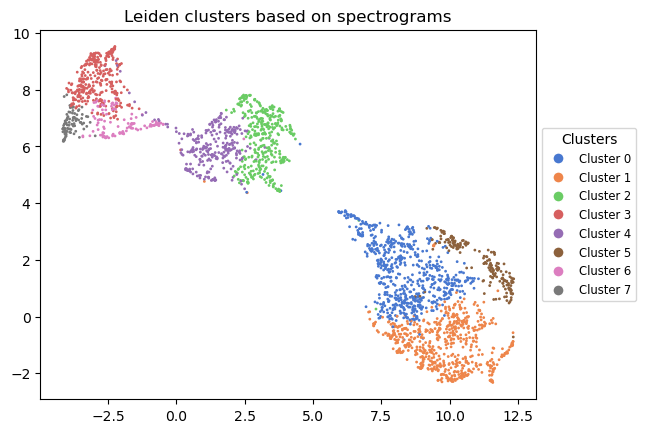

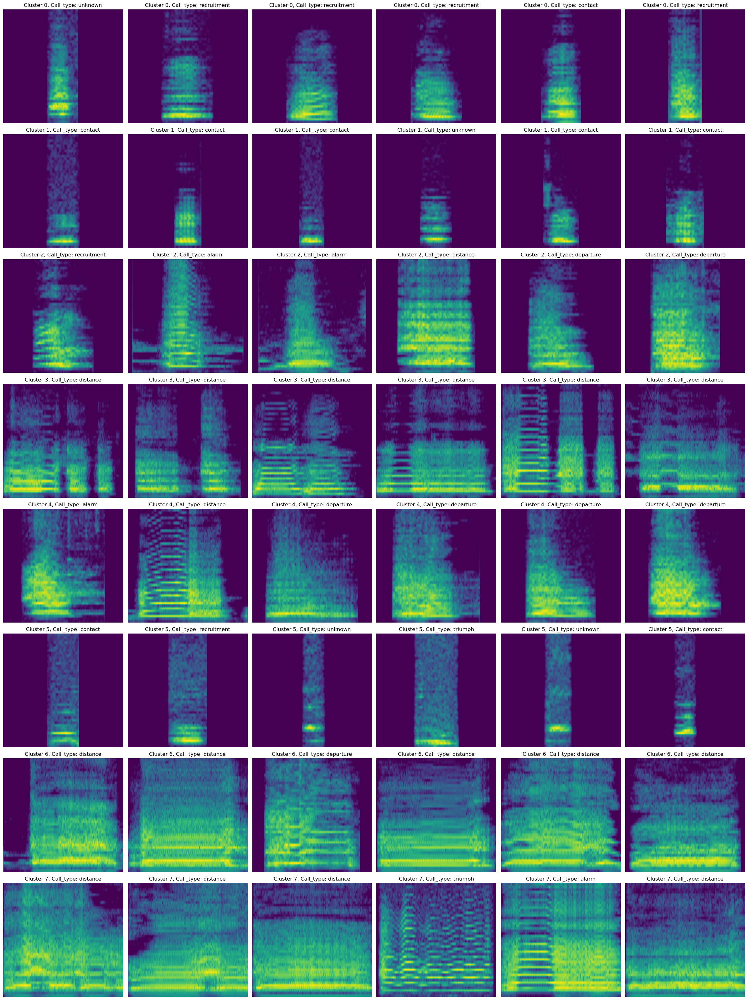

In [659]:
labels, leiden_partition_specs = leiden_cluster_from_nn_graph(nn_results_spec, "leiden_cluster_spectrogram", resolution_parameter=0.8)
plot_clusters_on_embeddings(labels, embeddings_spec, title="Leiden clusters based on spectrograms")
plot_cluster_examples("leiden_cluster_spectrogram", np.unique(labels))

100%|██████████| 2634/2634 [00:00<00:00, 121512.52it/s]


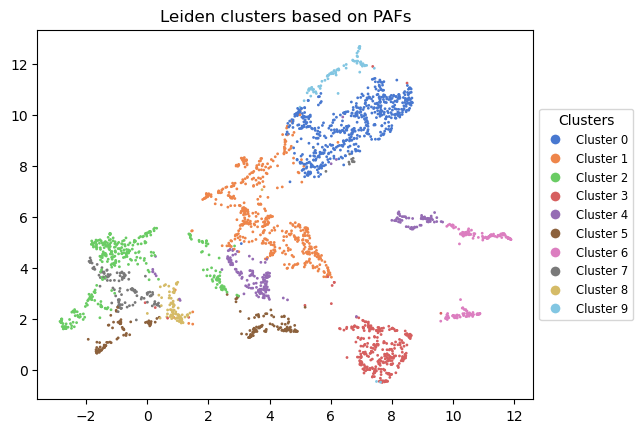

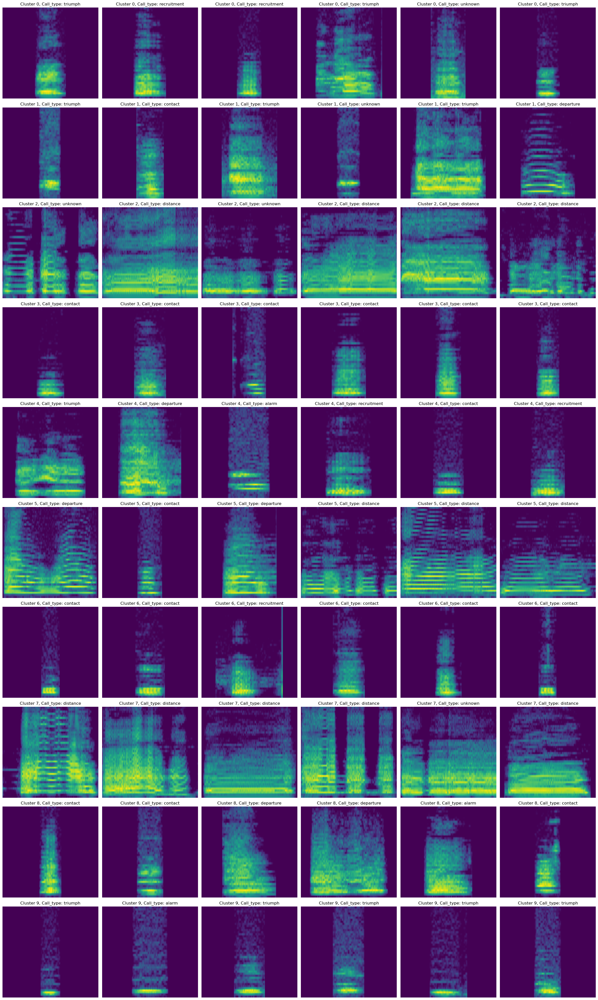

In [688]:
labels, leiden_partition_pafs = leiden_cluster_from_nn_graph(nn_results_paf, "leiden_cluster_paf", resolution_parameter=0.5)
plot_clusters_on_embeddings(labels, embeddings_paf, title="Leiden clusters based on PAFs")
plot_cluster_examples("leiden_cluster_paf", np.unique(labels))

## Validation

##### Hopkins statistic

##### Silhouette score

In [696]:
print("--------silhouette score--------\n")
print(f"PAFs + k-means:\t\t\t\t {max_sil_score_kmeans_paf}")
print(f"Embeddings of PAFs + k-means:\t\t {max_sil_score_kmeans_paf_emb}")
print(f"Embeddings of spectrograms + k-means:\t {max_sil_score_kmeans_spec}")
print(f"PAFs + HDBSCAN:\t\t\t\t {silhouette_score(features_scaled, hdbscan_clusters_paf.fit_predict(features_scaled))}")
print(f"Embeddings of PAFs + HDBSCAN:\t\t {silhouette_score(embeddings_paf, hdbscan_clusters_paf.fit_predict(embeddings_paf))}")
print(f"Embeddings of spectrograms + HDBSCAN:\t {silhouette_score(embeddings_spec, hdbscan_clusters_spec.fit_predict(embeddings_spec))}")

_, knn_dists, _ = nn_results_paf
print(f"PAFs + Leiden:\t\t\t\t {silhouette_score(knn_dists, leiden_partition_pafs.membership)}")
_, knn_dists, _ = nn_results_spec
print(f"Spectrograms + Leiden:\t\t\t {silhouette_score(knn_dists, leiden_partition_specs.membership)}")

--------silhouette score--------

PAFs + k-means:				 0.2158985951815692
Embeddings of PAFs + k-means:		 0.5421035289764404
Embeddings of spectrograms + k-means:	 0.7145577669143677
PAFs + HDBSCAN:				 0.0901203380324449
Embeddings of PAFs + HDBSCAN:		 0.2508471608161926
Embeddings of spectrograms + HDBSCAN:	 0.6888514161109924
PAFs + Leiden:				 -0.23301970958709717
Spectrograms + Leiden:			 0.005335100926458836


##### V-measure

In [662]:
from sklearn.metrics.cluster import v_measure_score

In [ ]:
print("--------V-measure--------\n")
# TODO exclude unknown
print(f"PAFs + k-means:\t\t\t\t {v_measure_score(calls_df['encoded_call_type'], labels_kmeans_paf)}, n_clusters: {n_clusters_kmeans_paf}")
print(f"Embeddings of PAFs + k-means:\t\t {v_measure_score(calls_df['encoded_call_type'], labels_kmeans_paf_emb)}, n_clusters: {n_clusters_kmeans_paf_emb}")
print(f"Embeddings of spectrograms + k-means:\t {v_measure_score(calls_df['encoded_call_type'], labels_kmeans_spec)}, n_clusters: {n_clusters_kmeans_spec}")
print(f"PAFs + HDBSCAN:\t\t\t\t {v_measure_score(calls_df['encoded_call_type'], hdbscan_clusters_paf.fit_predict(features_scaled))}, n_clusters: {hdbscan_clusters_paf.labels_.max()+1}")
print(f"Embeddings of PAFs + HDBSCAN:\t\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), hdbscan_clusters_paf_emb.fit_predict(embeddings_paf))}, n_clusters: {hdbscan_clusters_paf_emb.labels_.max()+1}")
print(f"Embeddings of spectrograms + HDBSCAN:\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), hdbscan_clusters_spec.fit_predict(embeddings_spec))}, n_clusters: {hdbscan_clusters_spec.labels_.max()+1}")
print(f"PAFs + Leiden:\t\t\t\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), leiden_partition_pafs.membership)}, n_clusters: {np.max(leiden_partition_pafs.membership)}")
print(f"Spectrograms + Leiden:\t\t\t {silhouette_score(np.asarray(calls_df['encoded_call_type']).reshape(-1, 1), leiden_partition_specs.membership)}, n_clusters: {np.max(leiden_partition_specs.membership)}")

--------V-measure--------

PAFs + k-means:				 0.1724308331587217, n_clusters: 2
Embeddings of PAFs + k-means:		 0.4075032262300291, n_clusters: 5
Embeddings of spectrograms + k-means:	 0.4088857691217194, n_clusters: 2
PAFs + HDBSCAN:				 0.11337879592909772, n_clusters: 3
Embeddings of PAFs + HDBSCAN:		 0.0012870234163598763, n_clusters: 5
Embeddings of spectrograms + HDBSCAN:	 0.08105804636268442, n_clusters: 3
PAFs + Leiden:				 -0.041677601818515604, n_clusters: 9
Spectrograms + Leiden:			 -0.20578331620401027, n_clusters: 7
